In [1]:
import numpy as np
import pandas as pd
import cufflinks as cf
import plotly.offline as plyo
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN, KMeans
from numba import jit
from pathlib import Path
from scipy.spatial import distance_matrix

In [2]:
def read_bl2(path):
    return np.core.records.fromfile(str(path),formats='f8,(2048)i2,f8,(2048)i2',names='tstamp,pwave,ptime,wave')

In [3]:
saturatedData = np.array(np.arange(2048))
# List all files in directory using pathlib
basepath = Path("/Users/elicarter/Local/FominResearch/RealData/runs/s_1000")
files_in_basepath = (entry for entry in basepath.iterdir() if entry.is_file())
for item in files_in_basepath:
    if str(item).endswith(".dat"):
        saturatedData = np.vstack((saturatedData, read_bl2(item)["wave"]))
saturatedData = np.delete(saturatedData, [0], 0) #delete the placeholder shape row

In [4]:
#delete all data that goes over 30,000 as it's pre amp saturated
data = np.copy(saturatedData)
over30k = False
#iterate backwards to avoid index proboems with removing
for i in range(len(saturatedData)-1,-1,-1):
    for j in range(len(saturatedData[0])-1,-1,-1):
        if (saturatedData[i,j] > 30000):
            data = np.delete(data, i, axis=0)
            break

In [58]:
np.random.shuffle(data)

In [59]:
print(np.shape(saturatedData))
print(np.shape(data))

(8590, 2048)
(8554, 2048)


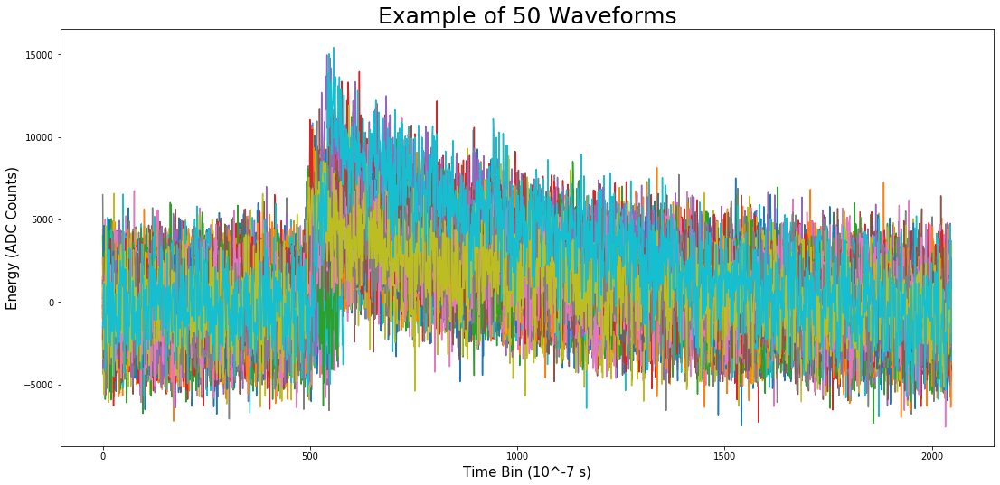

In [60]:
t = np.arange(2048)
for i in range(100, 150):
    plt.plot(t, data[i])
fig = plt.title("Example of 50 Waveforms", fontsize=25)
fig = plt.xlabel("Time Bin (10^-7 s)", fontsize=15)
fig = plt.ylabel("Energy (ADC Counts)", fontsize=15)
fig = plt.gcf()
fig.set_size_inches(18.5, 8.5)

# Dimensionality Reduction using principal component analysis¶

In [61]:
u, s, vh = np.linalg.svd(data, full_matrices=False)

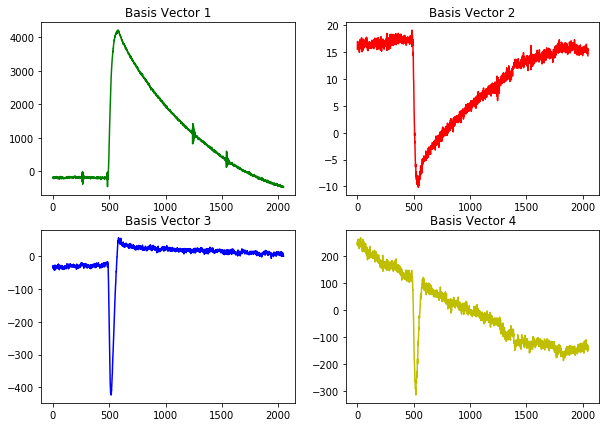

In [62]:
fig, ax = plt.subplots(2,2, figsize = (10,7))
ax[0,0].plot(u[0,0]*s[0]*vh[0], color = 'g')
ax[0,0].title.set_text("Basis Vector 1")
ax[0,1].plot(u[1,1]*s[1]*vh[1], color = 'r')
ax[0,1].title.set_text("Basis Vector 2")
ax[1,0].plot(u[2,2]*s[2]*vh[2], color = 'b')
ax[1,0].title.set_text("Basis Vector 3")
ax[1,1].plot(u[3,3]*s[3]*vh[3], color = 'y')
ax[1,1].title.set_text("Basis Vector 4")

use scree plot and percent variance to find where we should make the cut on demensions

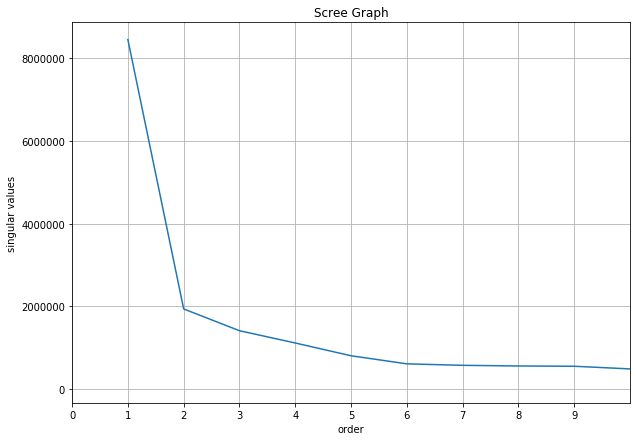

In [63]:
scree_order = np.arange(1,len(s)+1)
fig, ax = plt.subplots(1, 1, figsize = (10,7))
ax.plot(scree_order, s)
ax.title.set_text("Scree Graph")
ax.set_ylabel("singular values")
ax.set_xlabel("order")
ax.set_xlim([0,10])
ax.set_xticks(np.arange(0,10))
plt.grid()
plt.show()

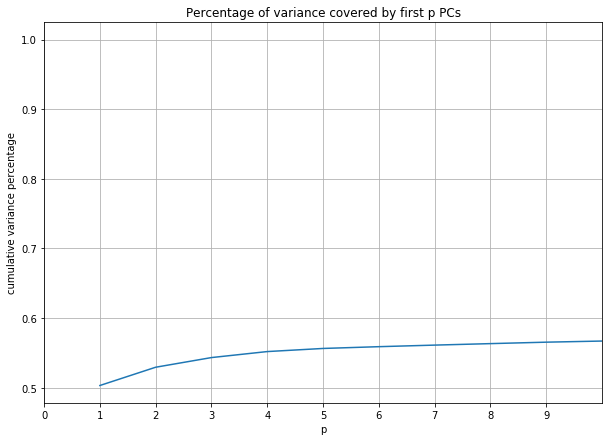

In [64]:
variance = np.zeros_like(s)
for i in range(len(s)):
    variance[i] = s[i]**2
total_variance = 0
for i in range(len(variance)):
    total_variance += variance[i]
    
pvc = np.zeros_like(variance)
for i in range(len(pvc)):
    pvc[i] = variance[i] + pvc[i-1]
for i in range(len(pvc)):
    pvc[i] = pvc[i] / total_variance
    
fig, ax = plt.subplots(1, 1, figsize = (10,7))
ax.plot(scree_order, pvc)
ax.title.set_text('Percentage of variance covered by first p PCs')
ax.set_xlabel('p')
ax.set_ylabel('cumulative variance percentage')
ax.set_xlim(0,10)
ax.set_xticks(np.arange(0,10))
plt.grid()
plt.show()

make cut at 5 for accuracy and at 2 for visuals

In [65]:
v = np.transpose(vh)
v2D = v[:,:2]
v5D = v[:,:5]

rData2D = data@v2D
rData5D = data@v5D

CPU times: user 123 ms, sys: 3.01 ms, total: 126 ms
Wall time: 31.8 ms


(-318687.6399641169,
 390038.15434431256,
 -503187.00976878696,
 285755.44111761847)

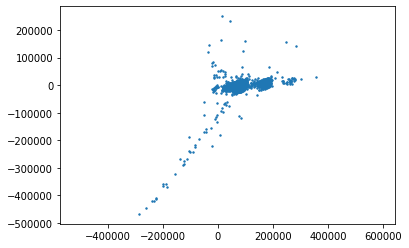

In [66]:
%time plt.scatter(rData2D[:,0], rData2D[:,1], s=2)
plt.axis("equal")

# Start DBScan

In [67]:
doubleDistances2 = distance_matrix(rData2D, rData2D)
#double counts distances. Get upper triangle matrix then manipulate it 
temp2 = np.triu(doubleDistances2)
distances2 = np.asarray(temp2).reshape(-1)
distances2 = np.sort(distances2)
distances2 = np.flip(distances2)
#remove 0s where repeats used to be
nonzeros = int((len(doubleDistances2)*len(doubleDistances2) - 1)/2)
distances2 = distances2[0:nonzeros]
order = np.arange

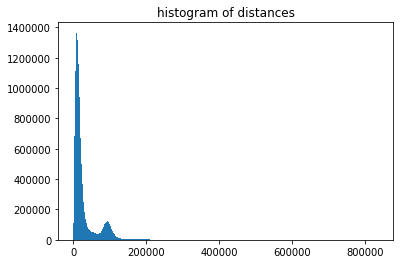

In [68]:
plt.title("histogram of distances")
fig11 = plt.hist(distances2, 1000)

(0, 20000)

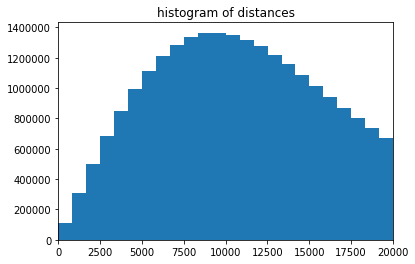

In [69]:
plt.title("histogram of distances")
fig11 = plt.hist(distances2, 1000)
plt.xlim(0,20000)

5,000 to 12,500 is the most common distances so try epsilon values in this range

In [70]:
db2 = DBSCAN(eps = 7750, min_samples = 10).fit(rData2D)
core2 = db2.core_sample_indices_
components2 = db2.components_
labels2 = db2.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters2 = len(set(labels2)) - (1 if -1 in labels2 else 0)
n_noise2 = list(labels2).count(-1)

counts2 = np.zeros(n_clusters2)
for i in range(n_clusters2):
    for label in labels2:
        if label == i:
            counts2[i] += 1

In [71]:
print ("Number of clusters: " + str(n_clusters2))
print ("Number of noise points: " + str(n_noise2))
print ("% of data included in clustering: " + str (1 - n_noise2/len(labels2)))

Number of clusters: 3
Number of noise points: 140
% of data included in clustering: 0.983633387888707


In [72]:
percentage_counts2 = counts2/len(data)
for i in range(len(percentage_counts2)):
    percentage_counts2[i] = round(percentage_counts2[i], 3)

In [73]:
colors = {}
colors[-1] = 'black'
colors[0] = 'r'
colors[1] = 'g'
colors[2] = 'b'
colors[3] = 'c'
colors[4] = 'm'
colors[5] = 'y'
colors[6] = 'pink'
colors[7] = 'purple'
colors[8] = 'silver'
colors[9] = 'brown'
colors[10] = 'olive'
colors[11] = 'aquamarine'
colors[12] = 'cornflowerblue'
colors[13] = 'teal'
colors[14] = 'salmon'
colors[15] = 'lime'
colors[16] = 'gold'

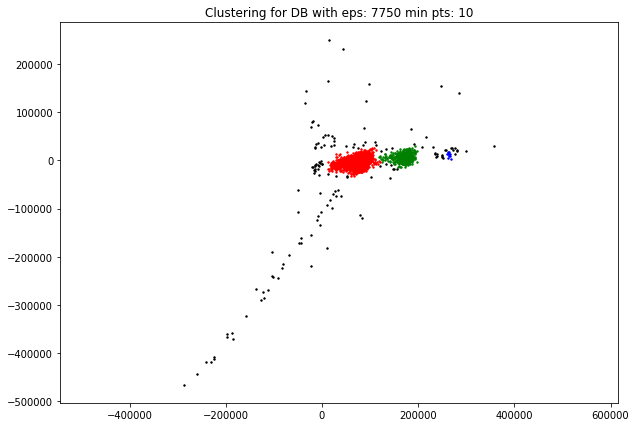

In [74]:
cvec = [colors[label] for label in labels2]
x = rData2D[:,0]
y = rData2D[:,1]
fig, ax = plt.subplots(figsize = (10,7))
for i in range(len(data)): #NOTE: not all data is being plotted
    ax.scatter(x[i],y[i], c = cvec[i], s=2)
ax.title.set_text('Clustering for DB with eps: ' + str(db2.eps) + ' min pts: ' + str(db2.min_samples))
plt.axis("equal")
plt.show()

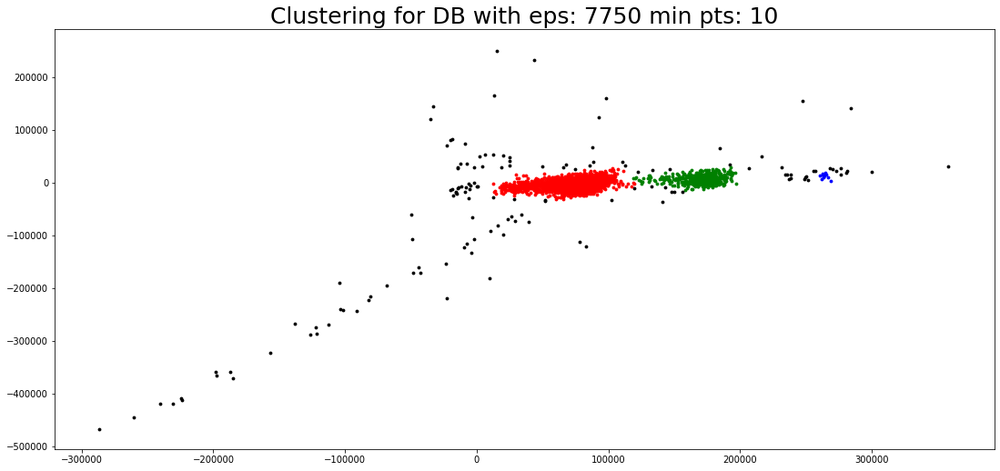

In [75]:
cvec = [colors[label] for label in labels2]
x = rData2D[:,0]
y = rData2D[:,1]
for i in range(len(data)): #NOTE: not all data is being plotted
    plt.scatter(x[i],y[i], c = cvec[i], s=8)
plt.title('Clustering for DB with eps: ' + str(db2.eps) + ' min pts: ' + str(db2.min_samples), fontsize=25)
fig = plt.gcf()
fig.set_size_inches(18.5, 8.5)

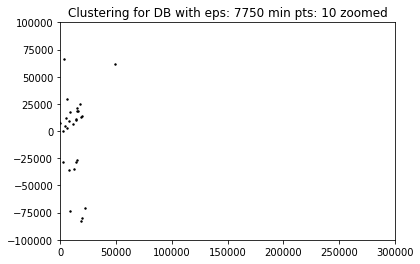

In [35]:
fig, ax = plt.subplots()
for i in range(len(x)): #NOTE: all data is being plotted
    ax.scatter(x[i],y[i], c = cvec[i], s=2)
ax.title.set_text('Clustering for DB with eps: ' + str(db2.eps) + ' min pts: ' + str(db2.min_samples) + ' zoomed')
ax.set_xlim(0, 300000, auto=False)
ax.set_ylim(-100000, 100000, auto=False)
plt.show()

In [36]:
#props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
#fig, ax = plt.subplots(n_clusters2+1, figsize = (20,50))
t = np.arange(2048)
unclustered2D = np.array(np.arange(2048))
for n in range(len(labels2)):
    for i in range(-1, n_clusters2):
        if i == labels2[n]:
            if (i == -1):
                unclustered2D = np.vstack((unclustered2D, data[n]))
            #ax[i].plot(t, data[n])
            #ax[i].title.set_text("Cluster " + str(i))
            #ax[i].set_xlabel("time bins")
            #ax[i].set_ylabel("Energy")
#for i in range(n_clusters2):
        #text_x = ax[i].get_xlim()[1] - 0.4*(ax[i].get_xlim()[1] - ax[i].get_xlim()[0])
        #text_y = ax[i].get_ylim()[1] - 0.1*(ax[i].get_ylim()[1] - ax[i].get_ylim()[0])
        #ax[i].text(text_x, text_y, "Percentage of data in cluster: " + str(round(100*percentage_counts2[i], 3)) + "%", bbox = props)
#plt.show()

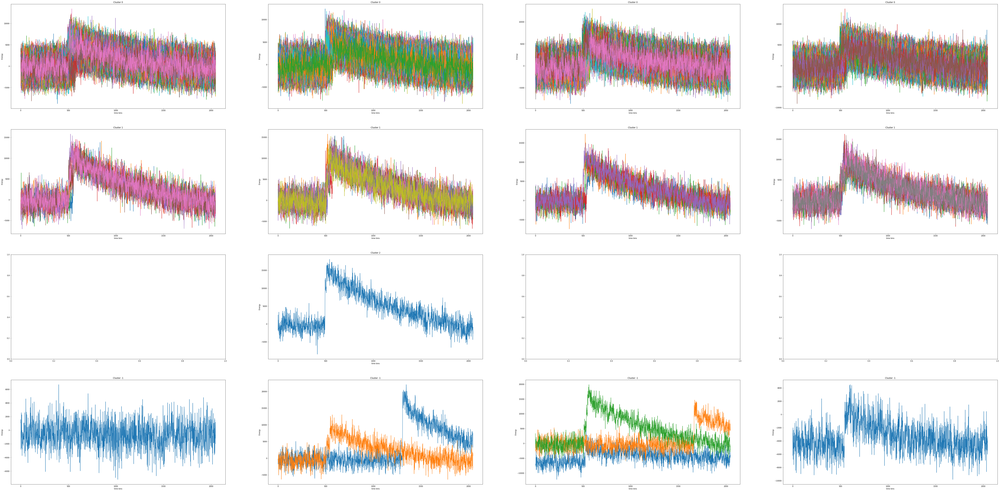

In [23]:
#Plot each group in 4 plots
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots(n_clusters2+1, 4, figsize = (100,50))
t = np.arange(2048)
for j in range(0, 4):
    numPer = int(500 / 4) #NOTE: Not all data is being shown. 500 per column
    for n in range(j*numPer, (j+1)*numPer):
        for i in range(-1, n_clusters2):
            if i == labels2[n]:
                ax[i][j].plot(t, data[n])
                ax[i][j].title.set_text("Cluster " + str(i))
                ax[i][j].set_xlabel("time bins")
                ax[i][j].set_ylabel("Energy")
plt.show()

# Clustering the unclustered

In [24]:
#go through data and pull ones with clustered tags
print(len(unclustered2D))

141


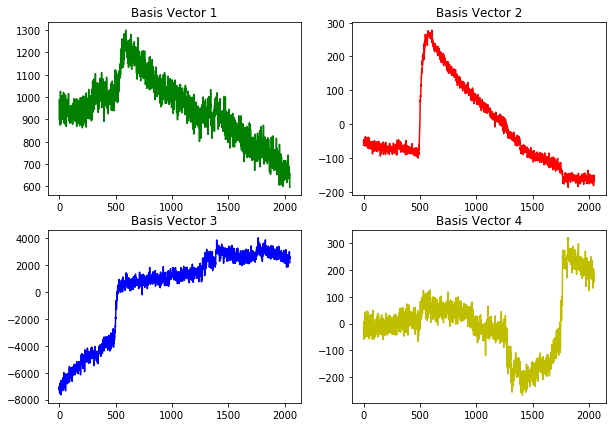

In [25]:
u, s, vh = np.linalg.svd(unclustered2D, full_matrices=False)
fig, ax = plt.subplots(2,2, figsize = (10,7))
ax[0,0].plot(u[0,0]*s[0]*vh[0], color = 'g')
ax[0,0].title.set_text("Basis Vector 1")
ax[0,1].plot(u[1,1]*s[1]*vh[1], color = 'r')
ax[0,1].title.set_text("Basis Vector 2")
ax[1,0].plot(u[2,2]*s[2]*vh[2], color = 'b')
ax[1,0].title.set_text("Basis Vector 3")
ax[1,1].plot(u[3,3]*s[3]*vh[3], color = 'y')
ax[1,1].title.set_text("Basis Vector 4")

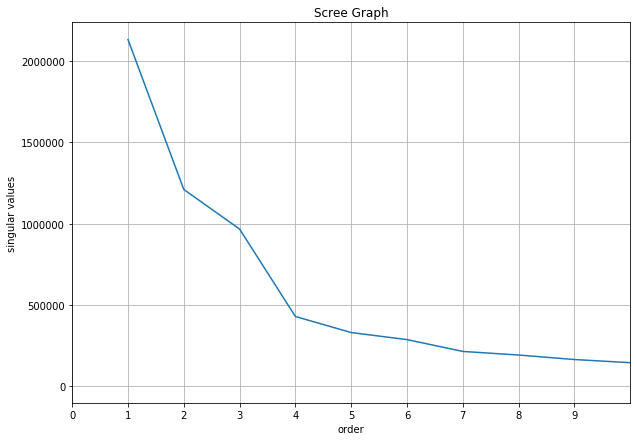

In [26]:
scree_order = np.arange(1,len(s)+1)
fig, ax = plt.subplots(1, 1, figsize = (10,7))
ax.plot(scree_order, s)
ax.title.set_text("Scree Graph")
ax.set_ylabel("singular values")
ax.set_xlabel("order")
ax.set_xlim([0,10])
ax.set_xticks(np.arange(0,10))
plt.grid()
plt.show()

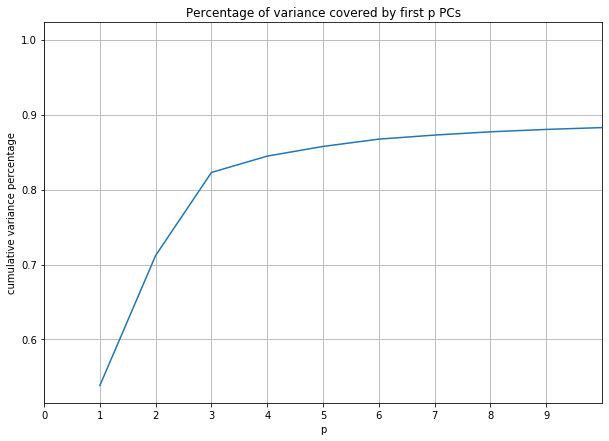

In [27]:
variance = np.zeros_like(s)
for i in range(len(s)):
    variance[i] = s[i]**2
total_variance = 0
for i in range(len(variance)):
    total_variance += variance[i]
    
pvc = np.zeros_like(variance)
for i in range(len(pvc)):
    pvc[i] = variance[i] + pvc[i-1]
for i in range(len(pvc)):
    pvc[i] = pvc[i] / total_variance
    
fig, ax = plt.subplots(1, 1, figsize = (10,7))
ax.plot(scree_order, pvc)
ax.title.set_text('Percentage of variance covered by first p PCs')
ax.set_xlabel('p')
ax.set_ylabel('cumulative variance percentage')
ax.set_xlim(0,10)
ax.set_xticks(np.arange(0,10))
plt.grid()
plt.show()

In [28]:
v = np.transpose(vh)
v3D = v[:,:3]

uData3D = unclustered2D@v3D

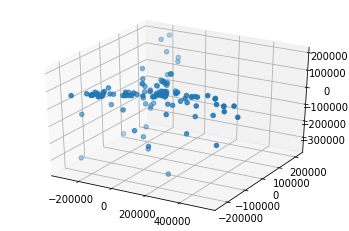

In [29]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(uData3D[:,0], uData3D[:,1], uData3D[:,2])

In [30]:
doubleDistances3 = distance_matrix(uData3D, uData3D)
#double counts distances. Get upper triangle matrix then manipulate it 
temp3 = np.triu(doubleDistances3)
distances3 = np.asarray(temp3).reshape(-1)
distances3 = np.sort(distances3)
distances3 = np.flip(distances3)
#remove 0s where repeats used to be
nonzeros = int((len(doubleDistances3)*len(doubleDistances3) - 1)/2)
distances3 = distances3[0:nonzeros]
order = np.arange

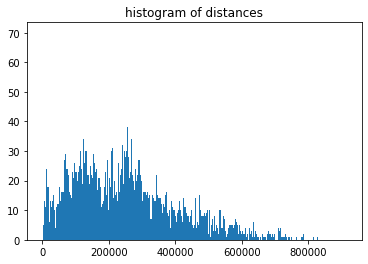

In [31]:
plt.title("histogram of distances")
fig11 = plt.hist(distances3, 1000)

In [32]:
dbU3 = DBSCAN(eps = 50000, min_samples = 10).fit(uData3D)
coreU3 = dbU3.core_sample_indices_
componentsU3 = dbU3.components_
labelsU3 = dbU3.labels_

# Number of clusters in labels, ignoring noise if present.
n_clustersU3 = len(set(labelsU3)) - (1 if -1 in labelsU3 else 0)
n_noiseU3 = list(labelsU3).count(-1)

countsU3 = np.zeros(n_clustersU3)
for i in range(n_clustersU3):
    for label in labelsU3:
        if label == i:
            countsU3[i] += 1

In [33]:
print ("Number of clusters: " + str(n_clustersU3))
print ("Number of noise points: " + str(n_noiseU3))
print ("% of data included in clustering: " + str (1 - n_noiseU3/len(labelsU3)))

Number of clusters: 3
Number of noise points: 59
% of data included in clustering: 0.5815602836879432


In [34]:
percentage_countsU3 = countsU3/len(data)
for i in range(len(percentage_countsU3)):
    percentage_countsU3[i] = round(percentage_countsU3[i], 3)

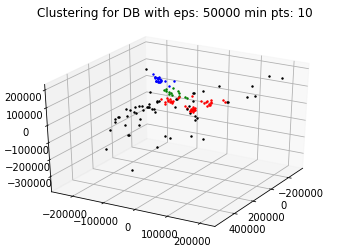

In [35]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
cvec = [colors[label] for label in labelsU3]
x = uData3D[:,0]
y = uData3D[:,1]
z = uData3D[:,2]
for i in range(len(labelsU3)):
    ax.scatter(x[i],y[i],z[i], c = cvec[i], s=2)
ax.title.set_text('Clustering for DB with eps: ' + str(dbU3.eps) + ' min pts: ' + str(dbU3.min_samples))
ax.view_init(30, 30)#rotate
plt.show()

In [36]:
plyo.init_notebook_mode(connected=True)
df = pd.DataFrame(uData3D[:,0], columns=["x"], index=np.arange(len(uData3D[:,0])))
df["y"] = uData3D[:,1]
df["z"] = uData3D[:,2]
print(df)

                 x              y              z
0    -43147.999261   17313.874292   25639.868444
1     30204.920578   -5447.354406   -6788.929383
2   -124364.924537  141279.792258  141924.750917
3    -86852.878421 -108247.454864   36052.044285
4    193013.426543  -73427.257677   32962.223531
..             ...            ...            ...
136 -185472.279986  212641.352232  190882.996314
137  -69705.417843  -26483.450021   12836.598834
138   35656.069592  -65552.305395   25659.438306
139 -165174.021499 -156974.865845   66287.876048
140   52183.908767  -58256.111503   38692.707212

[141 rows x 3 columns]


In [51]:
plyo.iplot(df.iplot(x="x", y="y", z="z", kind='scatter3d', asFigure=True))

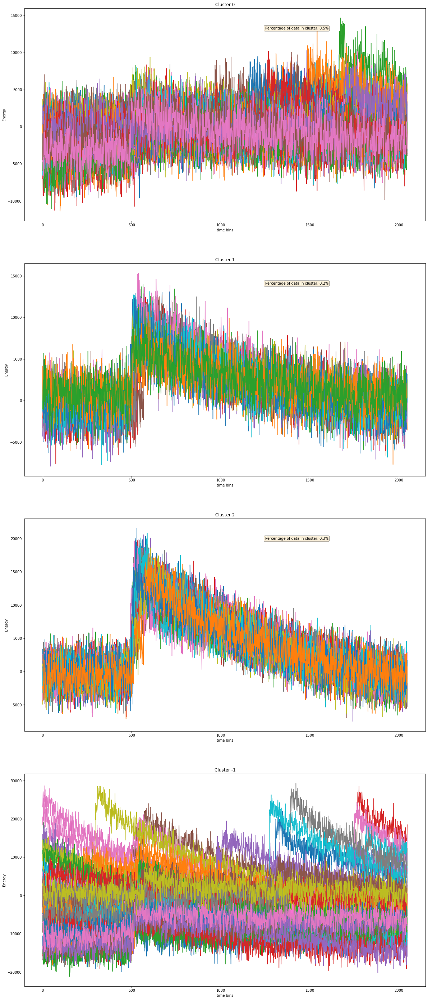

In [38]:
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots(n_clustersU3+1, figsize = (20,50))
t = np.arange(2048)
for n in range(len(labelsU3)):
    for i in range(-1, n_clustersU3):
        if i == labelsU3[n]:
            ax[i].plot(t, unclustered2D[n])
            ax[i].title.set_text("Cluster " + str(i))
            ax[i].set_xlabel("time bins")
            ax[i].set_ylabel("Energy")
for i in range(n_clustersU3):
        text_x = ax[i].get_xlim()[1] - 0.4*(ax[i].get_xlim()[1] - ax[i].get_xlim()[0])
        text_y = ax[i].get_ylim()[1] - 0.1*(ax[i].get_ylim()[1] - ax[i].get_ylim()[0])
        ax[i].text(text_x, text_y, "Percentage of data in cluster: " + str(round(100*percentage_countsU3[i], 3)) + "%", bbox = props)
plt.show()

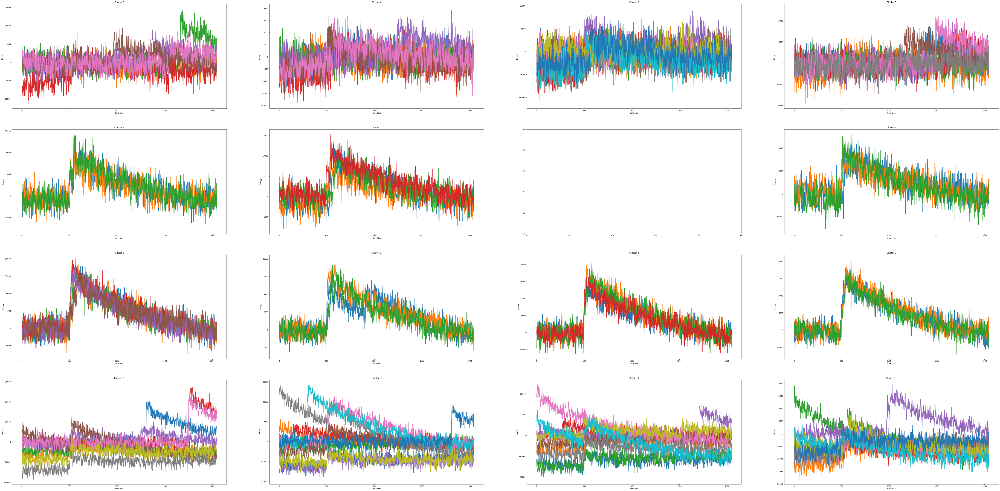

In [39]:
#Plot each group in 4 plots
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
fig, ax = plt.subplots(n_clustersU3+1, 4, figsize = (100,50))
t = np.arange(2048)
for j in range(0, 4):
    numPer = int(100 / 4) #NOTE: Not all data is being shown. 100 per column
    for n in range(j*numPer, (j+1)*numPer):
        for i in range(-1, n_clustersU3):
            if i == labelsU3[n]:
                ax[i][j].plot(t, unclustered2D[n])
                ax[i][j].title.set_text("Cluster " + str(i))
                ax[i][j].set_xlabel("time bins")
                ax[i][j].set_ylabel("Energy")
plt.show()